# Function for plotting failed cells

In [19]:
from IPython.display import display_html
def restartkernel() :
    display_html("<script>Jupyter.notebook.kernel.restart()</script>",raw=True)
restartkernel()

In [2]:
from edec.afterprocessing import import_labels,load_sql
from edec.preprocessing import compute_cell_dev_array, compute_soc_deviation
import edec.afterprocessing as ap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates 
import gc
%matplotlib inline

In [3]:
def get_SOC_failed_cells(array):
    """Function what return will which cells is failing"""
    arr = np.array(compute_cell_dev_array(array))
    threshhold = 0.09

    failed_SOC_cells = np.where(arr >0.09)[0]
    return failed_SOC_cells

def get_Volt_failed_cells(array):
    """Function what return will which cells is failing"""
    arr = np.array(compute_cell_dev_array(array))
    threshhold = 0.09

    failed_SOC_cells = np.where(arr >0.09)[0]
    return failed_SOC_cells


def filter_failed_cells(unfiltered_array,failed_cells):
    """Create a filtered list based on failed cells"""
    filtered_array = [unfiltered_array[i] for i in failed_cells]
    return filtered_array

def normalize(x):
    median = np.median(x)
    return (x - median)/median # Can also use mean (Difference?)

def delete_rows_after_lastfail(df_tin):
    max_index = df_tin[df_tin["Fail"] == 1].index.values
    last_idx = max_index[-1]
    df_tin = df_tin[:last_idx + 1]
    return df_tin
    
def get_cell_fails_array(df_tin):
    """Return a pandas series with Failed Cell Soc value for eached failed cell (cell_fails)
       And a list with index numbers of failed cells failed_cells     
    """
    df_failed_cells = df_tin[df_tin["Failed cell SOC"].str.len() != 0]
    fail_dates = df_failed_cells["timestamp"].to_list()
    Un = np.array(df_failed_cells["Failed cell SOC"]) # Array with all arrays of failed cells (array[array[1,2], array[1,2])
    failed_cells = []
    for i in Un:
        failed_cells.extend(list(i))
    failed_cells = list(set(failed_cells))
    failed_cells.sort()

    cell_fails = df_tin["Sorted_SOC_deviation"].apply(lambda i:filter_failed_cells(i,failed_cells))
    return cell_fails, failed_cells, fail_dates

def generate_cell_df(df_tin, failed_cells, method): ### Lägger till method  method="Sorted_SOC_deviation"
    """Generate a datafram with each cell or fail as columns"""
    
    #df_clean = pd.DataFrame([x for x in df_tin["Sorted_SOC_deviation"]])
    df_clean = pd.DataFrame([x for x in df_tin[method]])
    df_clean.columns = ['x_cell_{}'.format(x) for x in range(108)]

    for i in range(len(df_clean.columns)):
        if i in failed_cells:
            df_clean.rename(columns={df_clean.columns[i]:df_clean.columns[i].replace("x","Fail")},inplace=True)
        else:
            df_clean.rename(columns={df_clean.columns[i]:df_clean.columns[i].replace("x","Healthy")},inplace=True)
    
    df_clean.insert(0, "timestamp",df_tin["timestamp"])
    df_clean.set_index('timestamp',inplace=True)
    return df_clean

def get_cell_status(col_name):
    """ 
    Get the status 0/1 for each column in df_clean 
    """
    
    if col_name.split("_")[0] == 'Healthy':
        cell_fail = 0
    else: 
        cell_fail = 1
    return cell_fail

def healty_column_names(df_clean_last_SOC):
    # df3
    """
    Retun a list of healty column names
    (function is used for dropping healty cells to get a df with failed cells only)

    """
    col_names = []
    for col_name in df_clean_last_SOC.columns:
        cell_fail = get_cell_status(col_name)
        col_names.append(cell_fail)
    arr = np.where(np.array(col_names) !=1)[0]
    arr = list(arr)
    healthy_drops = [df_clean_last_SOC.columns[i] for i in arr]
    return healthy_drops

def clean_df_tin(df_tin, method):
        # Get List of individual Tins
        df_tin = df_tin.reset_index()

        # Get type of fail (0 or 1)
        fail_type = df_tin["Fail"].unique().max()

        # Apply normalization (deviation)
        df_tin["Sorted_SOC_deviation"] = df_tin["Sorted_SOC"].apply(normalize)
        df_tin["Sorted_Voltage_deviation"] = df_tin["Sorted_Voltage"].apply(normalize)

        fail_dates = []
        failed_cells = []
        if fail_type == 1:
            df_tin = delete_rows_after_lastfail(df_tin)

            cell_fails, failed_cells, fail_dates = get_cell_fails_array(df_tin)
        
        # Generate dataframe with cells as columns
        df_clean = generate_cell_df(df_tin, failed_cells, method)
        return cell_fails, failed_cells, fail_dates, df_clean

In [3]:
claimlist1 = ('a82ab98a64dab23bf4aa1bbee6bcf2f8b4f23a5de74edfe79a7ceff3e2dd850c',
       '046994de6e1e013c2d4162502e19eb7b42a764c83d6d1213bf6d6bcd44b7ed49',
       '74f89d7e6a68aa5de245f7ea839d0db10815d44502a2112e192010ee2d60c629',
       '277f8f8aec3534be8448220ea3b99127dd8fc2bddb9140c25e97d8bf46dd1d1e',
       '0144e57f668058ebb3703b1fcdadd896fdb038f2449b729e5886ae7d51fe0725',
       'eb830e4babf5934638657124ac896b2b3ecb681011260e66ad48f746dd03a901',
       'd095e3278854e2999cd6aa3cf423457179d50c47de33ff07e0fed6aaa81099e3',
       '77cb437f82a3b29b021b16e028614ee48068d84a9dfa8e71762ff8ac1f92bf14',
       '265873d8277b1ff05fdce33bab3a292fcdf4be4df0103d388a82cb0ba5700108',
       '9728f656bdcff7aef9888478ebc2e7835936c52ba3b5e7bb6f69a554cb88af09',
       'aa595bd086d8454d1b8c50d8ca48b004773acf5199f7a12d53a1e3c3587c1096',
       '16b533e2d5cbfb3fa66357503bd773ebdfea557537f02bf088c067210798bbc1',
       '102ee98b695abed670870d66ed9d8e9a78c7a4343f480a0e5bffc51af03076d7',
       '460ed755a597b2b685a7ab5e02ecd5c073aff7735a18f82633ba8006da2d7f5c',
       '36ea9106b280d52434942ab822e91e1a602bd8517b1499ab32c0e48d368f046e')

claimlist2= ('31d976cc0260161219fab2d85bfc20f2fd837abf11de693f0cdd262adebf705e',
'f890289159601c39eb483a94ebd34572d984762e4a765379a9823786a509677d',
'a82ab98a64dab23bf4aa1bbee6bcf2f8b4f23a5de74edfe79a7ceff3e2dd850c',
'046994de6e1e013c2d4162502e19eb7b42a764c83d6d1213bf6d6bcd44b7ed49',
'74f89d7e6a68aa5de245f7ea839d0db10815d44502a2112e192010ee2d60c629',
'7b8faa5438d7b36014373f096699ded545b194251a18007f3e1057b4597313e6',
'a6501d842845fe9b0803a8bf60e4dbcfe046a0f942e555d6e96c0db5a174a62a',
'633a2abf73c98e94c8c0954460507493778cff82fd0a5f539ff69ad9533f7fba',
'277f8f8aec3534be8448220ea3b99127dd8fc2bddb9140c25e97d8bf46dd1d1e',
'4d4d94dc073cadacefdc6250dd908c72bc1fe608bbd218fedf33cb02666f97ea',
'0144e57f668058ebb3703b1fcdadd896fdb038f2449b729e5886ae7d51fe0725',
'6a62c3d7e59fa3b6187eaca7190f20b5605728c579d3be3f6ada7a54fbe81cf6',
'a15737e85bc90ecb7e5e66b0b9d475a0608170c402c9d1756f28ef9143c01926',
'e440013ce08950d076737627e6c6dae2f53519e8e1ee4f64c314253dbaad3037',
'6061cd087c349f1d6adf072747a4b39c9720a77f86f914c4255d17e1aff551f0',
'9408b2d98c96005834412dda693a722f0f9c29ad303807b79b9868d8d1bbef4f',
'c2cca219bd63802fb333ca703ca74c3853742e55b233ca4332e868d62ed2a879',
'eb830e4babf5934638657124ac896b2b3ecb681011260e66ad48f746dd03a901',
'0256f544c5567ba04cfef1e62811a9c271523fa9f08398bdeb9c64f24f71fd53',
'84601d08eeaaf6b102bf66bbf59e5fe8d4f8fe0db2c77beef2f549139f876eb0',
'857ecf7b4632ecef0721a50ad3cdcc83ea86b99cb82f669b471fa3089e82e650',
'f8b56894314d9c7036eaf3fe0c33c9c05f69f5dce9ffb20ff42a5319ea3759e6',
'153040d2718a614a7ea1ce5ead13bd0e268350510dbea737ba229a804e84a66e',
'9fe1599ad27eee0fefaeb07324c2bb7d848aa4082e16365fa47977283b32356f',
'36a48fe41b39d708172a7e612a2aa76ef3ef389dfbea33ac03708c75a936c330',
'7bf5442612cf01207dff4c08e572cce3a12c91392d6dae3a69658d16ed503711',
'c783899b9de46ee485a32193ceec81445266f066e87ade30334e09c1530979cd',
'27340543bf52003098d299d55600d84ed6f205721797e37a326791e8eff12792',
'f2ac9cab6f187c96c235c491cae16d575413c46e5b1da757cb146aee98f3cfa3',
'6d13f132b6606fddeb65157dce12ce970bde79214a6eb3def83dceca5da7def1',
'6d96f2f0eee2bf11aaece23282385195e6804ff8905897601876646acf8b792e',
'd095e3278854e2999cd6aa3cf423457179d50c47de33ff07e0fed6aaa81099e3',
'f5046c8ef2ab954b50feb7e69a81ff16c9252af55353090d23a3e134c77d7358',
'64dc7285984d9975f3b7c2716cb4c23fe4e861b19a04ce11ae3eaaeabb9fc042',
'eb1e60b78844be97100f496db710e51b034dd43de4b432192a7dbb86e5d95a0c',
'77cb437f82a3b29b021b16e028614ee48068d84a9dfa8e71762ff8ac1f92bf14',
'94e1f3623bf8e8e3687c581904e4f9452a5f2cc9d365272f055492c143ea64af',
'265873d8277b1ff05fdce33bab3a292fcdf4be4df0103d388a82cb0ba5700108',
'474735971b69e240c0ee4f678ace6426e96fdc2f408b7c09b43c93788fd81f46',
'9728f656bdcff7aef9888478ebc2e7835936c52ba3b5e7bb6f69a554cb88af09',
'e01430115d785d6c42fcd441162c98706069af23a0c40f41991e3d0d9502772e',
'1c7a05ee9199297e46c8ee9110641571576972dc2560bb10120e587ba40a40f3',
'46ccfe11b46f362a00a642c830aa6f8b4fe453530a9214e6b1a4666a8ebdda3d',
'901a724bd6caf9a1fa7f31ef044d85970fe95139df987ebd5cdafffd34773064',
'9e396f2958d7daed0826aac8f88e1405f75c67fd4620d3ab6b6e2bb01e5bb8d9',
'f3f0bc5bf9d36f23f76f7dc59372621bac253b5d8a7360955e77b010ca36e581',
'39fa208d5fa891c35cc722ebf324954a8f6d53ae46b74aea3932823bc501d9ed',
'3fd6ccad3908b9538521b856736d685d8c36be99a9a73faa7e611cc6eff1dff0',
'aa595bd086d8454d1b8c50d8ca48b004773acf5199f7a12d53a1e3c3587c1096',
'842385086edab721a4c2274411221b70b180050c501906ab2e39d091b88bc215',
'16b533e2d5cbfb3fa66357503bd773ebdfea557537f02bf088c067210798bbc1',
'e7586f83d7fcd91d932c54017ddcf7357984719082a724584691c797386072b1',
'31800fdec6ac63b9ea1cb4b540263b872ff807c10bde656c15e2b98f5e560a88',
'cdd94854e426fc078baf9048195ea744cf04e228cba24f1c55d660ba85622382',
'102ee98b695abed670870d66ed9d8e9a78c7a4343f480a0e5bffc51af03076d7',
'460ed755a597b2b685a7ab5e02ecd5c073aff7735a18f82633ba8006da2d7f5c',
'36ea9106b280d52434942ab822e91e1a602bd8517b1499ab32c0e48d368f046e',
'4ae85dc538354fa8ffdbc21d51ad6955312206fd2fb62d28dbece5a31dde9d69')

query = f"SELECT main_table.tin_an, [timestamp], [Sorted_SOC],[Sorted_Voltage],\
            cell_fail.Fail FROM main_table \
            INNER JOIN cell_fail \
            ON main_table.rid = cell_fail.rid \
            WHERE [tin_an] in {claimlist1}"

df = ap.load_sql(query, db="df.db")
df.head()

,tin_an,timestamp,Sorted_SOC,Sorted_Voltage,Fail
0,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2021-06-19 10:57:03.626,"[76.78, 76.84, 76.82, 76.82, 77.31, 76.72, 76....","[3.9657, 3.9665, 3.9659, 3.9657, 3.9712, 3.965...",0
1,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2022-04-01 10:44:14.529,"[34.25, 34.23, 34.12, 34.42, 33.99, 34.25, 34....","[3.6122, 3.6112, 3.6114, 3.6131, 3.6113, 3.611...",0
2,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2021-03-12 12:26:52.000,"[80.63, 80.73, 80.7, 80.68, 80.48, 80.56, 80.6...","[4.0054, 4.0074, 4.0069, 4.0061, 4.0035, 4.005...",0
3,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2022-02-19 12:44:08.938,"[72.48, 72.91, 72.86, 72.66, 73.32, 72.52, 72....","[3.9037, 3.9088, 3.9078, 3.9067, 3.9119, 3.904...",0
4,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2021-09-02 14:49:09.627,"[50.22, 50.41, 50.28, 49.95, 49.77, 50.24, 50....","[3.7024, 3.7045, 3.7032, 3.6997, 3.6978, 3.702...",0


In [81]:
cars_to_show = 10
tin_exclude_list = ('e440013ce08950d076737627e6c6dae2f53519e8e1ee4f64c314253dbaad3037','6a62c3d7e59fa3b6187eaca7190f20b5605728c579d3be3f6ada7a54fbe81cf6')
df = import_labels(label=1, db="df.db", n_random=cars_to_show, tin_exclude_list=False)
df.head(2)

10 Unique cars with label 1 has been imported with 2454 subsamples


,tin_an,timestamp,Sorted_SOC,Sorted_Voltage,Fail
362,36a48fe41b39d708172a7e612a2aa76ef3ef389dfbea33...,2020-11-27 12:47:36,"[90.28, 90.3, 89.58, 89.64, 89.63, 90.22, 90.1...","[4.0999, 4.1003, 4.0923, 4.0928, 4.0925, 4.099...",1
958,36a48fe41b39d708172a7e612a2aa76ef3ef389dfbea33...,2020-11-28 13:19:42,"[74.58, 74.62, 73.84, 73.9, 73.92, 74.51, 74.4...","[3.8991, 3.9004, 3.8927, 3.8925, 3.8912, 3.898...",1


In [4]:
## Importera single car
query = f"SELECT main_table.tin_an, [timestamp], [Sorted_SOC],[Sorted_Voltage],\
            cell_fail.Fail FROM main_table \
            INNER JOIN cell_fail \
            ON main_table.rid = cell_fail.rid \
            WHERE [tin_an] = 'eb1e60b78844be97100f496db710e51b034dd43de4b432192a7dbb86e5d95a0c'"

df = ap.load_sql(query, db="df.db")
df["timestamp"] = pd.to_datetime(df["timestamp"])
    # Sort by timestamp
df = df.sort_values(by=["timestamp"], ascending=True)
df.head()

,tin_an,timestamp,Sorted_SOC,Sorted_Voltage,Fail
24,eb1e60b78844be97100f496db710e51b034dd43de4b432...,2021-10-21 13:37:10.703,"[78.75, 78.8, 78.76, 78.59, 78.66, 78.8, 78.75...","[3.9986, 3.9991, 3.9986, 3.9969, 3.9976, 3.999...",0
51,eb1e60b78844be97100f496db710e51b034dd43de4b432...,2021-10-21 14:58:27.316,"[78.58, 78.63, 78.6, 78.43, 78.48, 78.63, 78.5...","[3.9939, 3.9945, 3.9941, 3.9923, 3.9929, 3.994...",0
123,eb1e60b78844be97100f496db710e51b034dd43de4b432...,2021-10-21 15:07:00.133,"[78.16, 78.21, 78.18, 78.01, 78.06, 78.21, 78....","[3.9907, 3.9912, 3.9907, 3.989, 3.9895, 3.9912...",0
41,eb1e60b78844be97100f496db710e51b034dd43de4b432...,2021-10-22 05:35:41.934,"[77.81, 77.86, 77.82, 77.65, 77.71, 77.86, 77....","[3.9879, 3.9883, 3.988, 3.9862, 3.9871, 3.9882...",0
104,eb1e60b78844be97100f496db710e51b034dd43de4b432...,2021-10-22 06:21:42.051,"[77.73, 77.78, 77.74, 77.57, 77.63, 77.78, 77....","[3.9811, 3.9821, 3.9817, 3.9797, 3.98, 3.9821,...",0


In [87]:
##### Fungerande kod
def plot_cells(df, plotting=False, show_legend=False, show_cells=1,method="Sorted_SOC_deviation"):
    """
    Function takes in df
    show_legend: True / False
    show_cells: [1: only fail] [0: Only Healthy] ["all": Both healthy and fail]
    Method: ["Sorted_SOC_deviation"] ["Sorted_Voltage_deviation"]
    """

    plot_params ={"linewidth":{
                                0: 0.2,
                                1: 1.5,
                                },
                    "linestyle":{0: "solid", #(0,(3,5,1,5)), # dashdotted
                                1: "solid",
                                }
                }


    # Annotate with Failed cell SOC and Voltage
    df["Failed cell SOC"] = df["Sorted_SOC"].apply(get_SOC_failed_cells)
    df["Failed cell Voltage"] = df["Sorted_Voltage"].apply(get_SOC_failed_cells)
    
    #global cars
    cars = df["tin_an"].unique()
    

    for car in range(len(cars)):
        
        # Get List of individual Tins
        df_tin = df[df["tin_an"] == cars[car]]
        
        # Clean df_tin
        cell_fails, failed_cells, fail_dates, df_clean = clean_df_tin(df_tin, method)

        trend_inication_fail_index  = fail_index_by_trendindicator(df_clean)
        
        if plotting:
            # Plot cells
            fig, ax = plt.subplots(1,2,figsize=(25,4),gridspec_kw={'width_ratios': [3, 1]})  

            for col_name in df_clean.columns:
                cell_fail = get_cell_status(col_name)
                if show_cells == cell_fail:
                    ax[0].plot(df_clean[col_name], label=col_name, marker='.', linewidth=plot_params["linewidth"][cell_fail], linestyle=plot_params["linestyle"][cell_fail])
                    
                if show_cells == "all":
                    ax[0].plot(df_clean[col_name], label=col_name, marker='.', linewidth=plot_params["linewidth"][cell_fail], linestyle=plot_params["linestyle"][cell_fail])

            if (show_cells == 1) or (show_cells == "all"):
                ymin, ymax = ax[0].get_ylim()
                ax[0].vlines(x=fail_dates, ymin=ymin, ymax=ymax, color='r',linewidth=0.8, linestyle=(0,(5,10)),label="Warning lamp")
                if len(trend_inication_fail_index) != 0:
                    ax[0].vlines(x=trend_inication_fail_index[0], ymin=ymin, ymax=ymax, color='b',linewidth=3, linestyle="solid",label="Algorithm prediction")
                
            if show_legend:
                ax[0].legend()
                if show_legend:
                    ax[0].legend(bbox_to_anchor=(-0.2, 0.0), loc='lower right')
                    
            # Plot scatterplot of cell mean
            color = [get_cell_status(i) for i in df_clean.columns.tolist()]
            #color = ax[0].get_color()
            x = np.linspace(0,107,108)
            y =  df_clean.mean()
            for i in range(len(x)):
                ax[1].scatter(x[i], y[i])
            
            #ax[1].legend()
            ax[1].set_title('Cell dev')
            ax[1].set_ylabel("Cell Percent Deviation")
            ax[1].set_xlabel("Cell Number")

            ax[0].set_title(f'Tin number {cars[car]}')
            ax[0].xaxis.set_major_locator(mdates.DayLocator(interval=20))
            plt.xticks(rotation=45, ha="left")
            #ax.xticks(rotation=45, ha="left")
            #ax[0].set_xticklabels(ax[0].get_xticks(), rotation = 45)

            #ax[0].set_ylim([0, 5])
            ax[1].set_ylim([-0.14, 0.14])
            ax[0].grid()
            
            ax[0].set_title(f'Tin number {cars[car]}')
            ax[0].set_ylabel("Cell Percent Deviation")
            plt.show()
            plt.close()
            gc.collect() 
            del x,y,color
    return df_clean, df_tin, cars, trend_inication_fail_index

In [88]:
def fail_index_by_trendindicator(df_clean):
    fail_index  = []
    for cell in df_clean.columns:
        #index = df_clean[df_clean.expanding().mean()[cell] < -0.0055].index
        index = df_clean[df_clean.rolling(10).std()[cell] > 0.01].index

            
        fail_index.extend(index)
    trend_inication_fail_index = list(set(fail_index))
    trend_inication_fail_index.sort()
    return trend_inication_fail_index 

<AxesSubplot:xlabel='timestamp'>

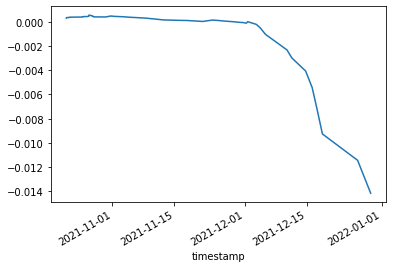

In [46]:
cell = "Fail_cell_16"
df_clean.expanding().mean()[cell].plot()

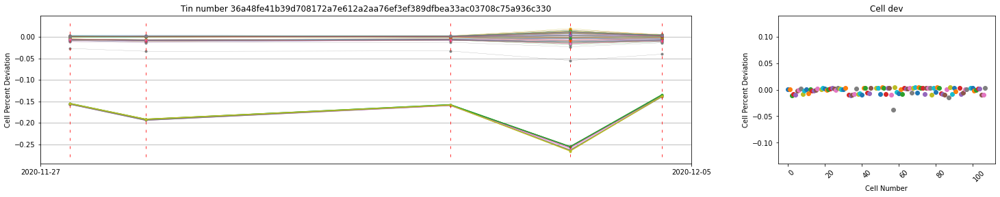

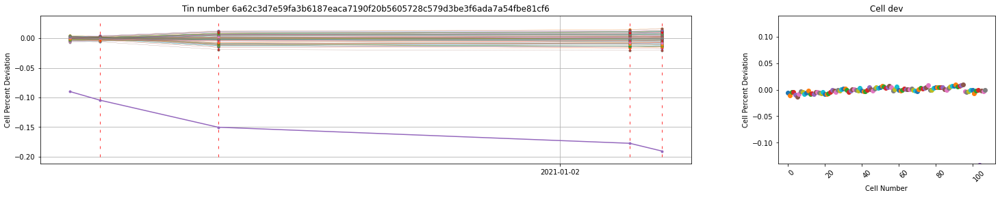

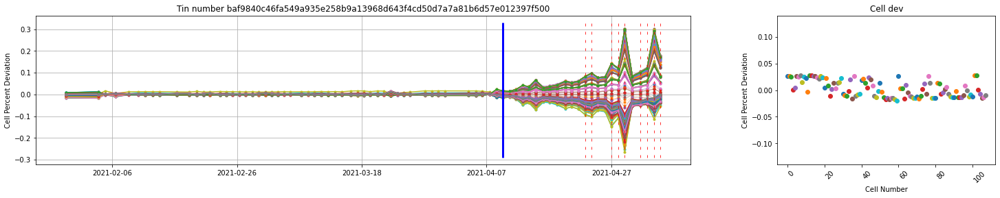

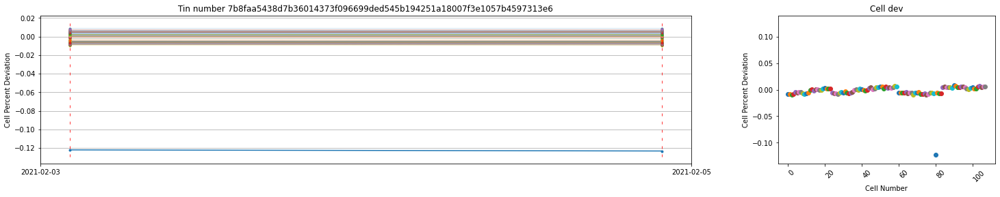

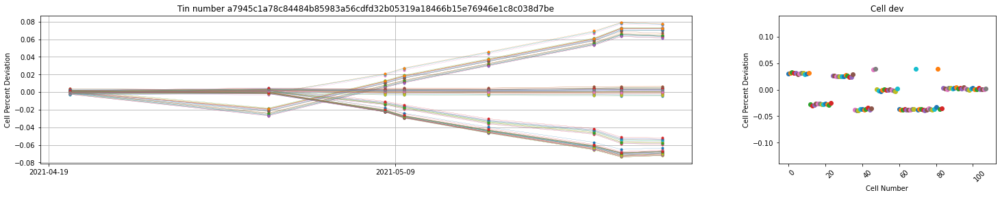

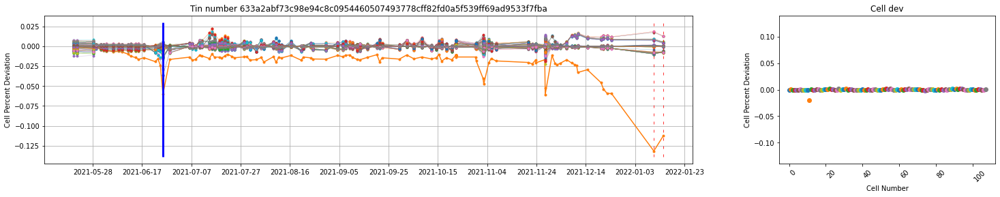

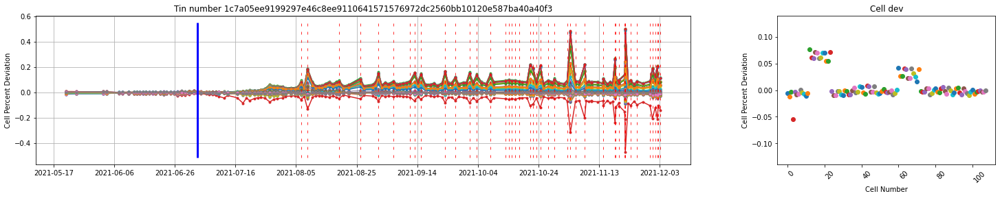

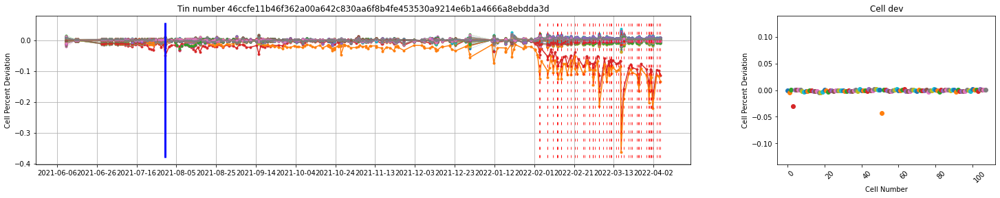

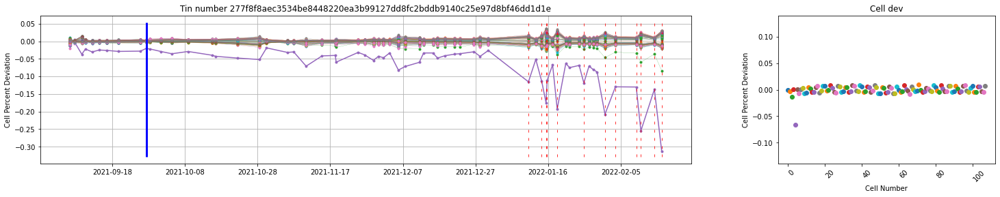

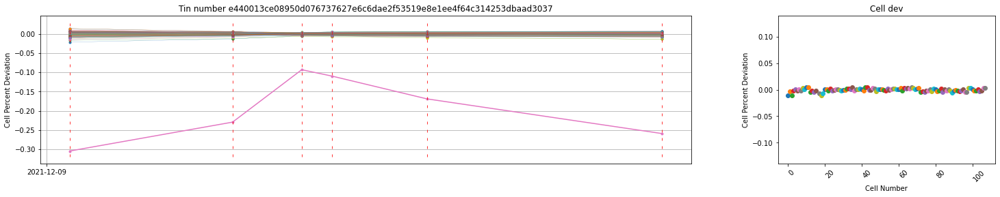

In [89]:
df_clean_last_SOC, df_tin_last, cars, trend_inication_fail_index = plot_cells(df, plotting=True, show_legend=True, show_cells="all", method="Sorted_SOC_deviation")
#cars

In [85]:
is empty(trend_inication_fail_index

Timestamp('2021-12-07 17:39:18.936000')

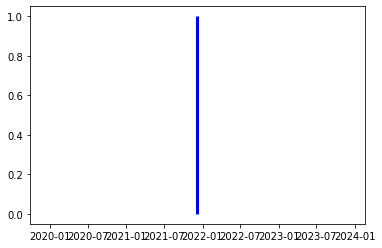

In [86]:
fig,ax = plt.subplots()
ax.vlines(x=trend_inication_fail_index[0], ymin=ymin, ymax=ymax, color='b',linewidth=3, linestyle="solid")


In [9]:
df3 = df_clean

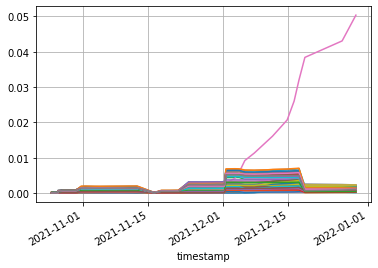

In [75]:
fig,ax = plt.subplots()
#cell = "Fail_cell_16"
for cell in df_clean.columns:

    #df_clean.expanding().std()[cell].plot()
    df_clean.rolling(10).std()[cell].plot()
    plt.grid()

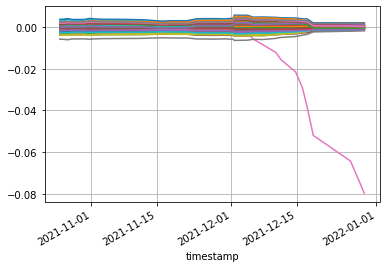

In [76]:
fig,ax = plt.subplots()
#cell = "Fail_cell_16"
for cell in df_clean.columns:

    #df_clean.expanding().std()[cell].plot()
    df_clean.rolling(10).mean()[cell].plot()
    plt.grid()

In [ ]:
((df3[cell].expanding().mean() -abs(df3[cell].median()))/abs(df3[cell].median())).plot()

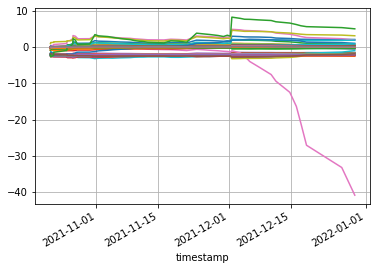

In [78]:
fig,ax = plt.subplots()
#cell = "Fail_cell_16"
for cell in df_clean.columns:

    #df_clean.expanding().std()[cell].plot()
    ((df_clean[cell].expanding().mean() -abs(df_clean[cell].median()))/abs(df_clean[cell].median())).plot()
    plt.grid()

In [12]:
# Om Fail  (Droppa alla Healthy)
df_clean_last_SOC.drop(healty_column_names(df_clean_last_SOC), axis=1,inplace=True)
df3 = df_clean_last_SOC
df3.head(2)


,Fail_cell_16
timestamp,
2021-10-21 13:37:10.703,0.000318
2021-10-21 14:58:27.316,0.000382


In [11]:
cell = "Fail_cell_16"
df3[cell].plot()

NameError: name 'df3' is not defined

<AxesSubplot:xlabel='timestamp'>

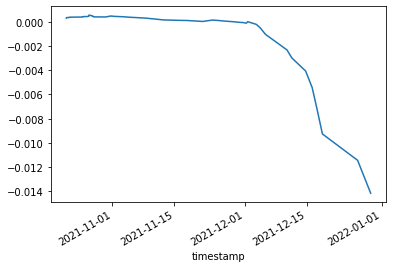

In [28]:

df4 = df3.expanding().mean()[cell]
df4.plot()

timestamp
2021-10-21 13:37:10.703    False
2021-10-21 14:58:27.316    False
2021-10-21 15:07:00.133    False
2021-10-22 05:35:41.934    False
2021-10-22 06:21:42.051    False
2021-10-22 06:58:48.873    False
2021-10-22 07:14:16.354    False
2021-10-22 07:15:01.313    False
2021-10-25 06:45:09.184    False
2021-10-25 07:09:07.123    False
2021-10-25 08:01:37.082    False
2021-10-25 08:03:27.019    False
2021-10-25 11:25:52.179    False
2021-10-26 06:25:45.247    False
2021-10-26 06:34:09.982    False
2021-10-26 16:10:19.207    False
2021-10-26 16:23:15.525    False
2021-10-27 05:28:47.457    False
2021-10-27 09:42:54.186    False
2021-10-27 09:56:46.648    False
2021-10-27 17:18:08.857    False
2021-10-27 17:37:59.379    False
2021-10-27 18:40:08.317    False
2021-10-30 11:16:17.399    False
2021-10-31 15:19:16.253    False
2021-11-01 11:11:41.663    False
2021-11-03 13:56:16.543    False
2021-11-04 15:24:07.342    False
2021-11-06 10:53:57.331    False
2021-11-08 15:41:12.486    False


<AxesSubplot:xlabel='timestamp'>

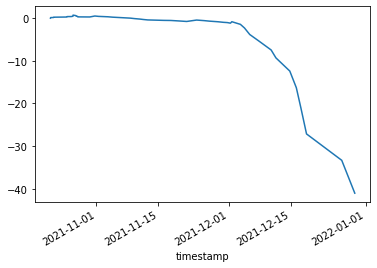

In [15]:
((df3[cell].expanding().mean() -abs(df3[cell].median()))/abs(df3[cell].median())).plot()

<AxesSubplot:xlabel='timestamp'>

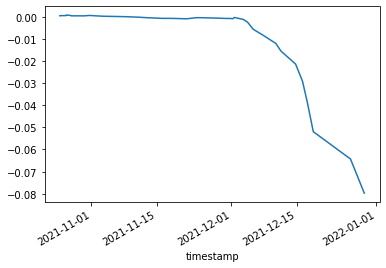

In [24]:
df3[cell].rolling(10).mean().plot()

<AxesSubplot:xlabel='timestamp'>

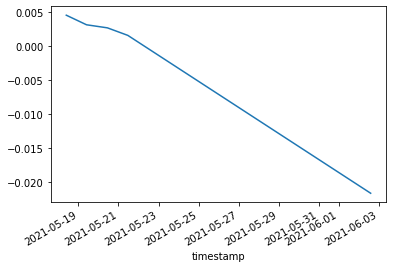

In [27]:
# Lutning
from scipy.stats import linregress
df3[cell].rolling(5).apply(lambda s: linregress(range(5), s.values)[0]).plot()

In [ ]:
df_tin_last

In [46]:
# Droppa index 0/1
#df_tin_last.drop(df_tin_last[df_tin_last.Fail == 0].index,inplace=True)

In [7]:
# Filtrera ut cell med negativt medelvärde som har störst varians
df_clean_last_SOC.var().where(df_clean_last_SOC.mean() <0).sort_values(ascending=False)

Fail_cell_84        0.018529
Fail_cell_22        0.018489
Fail_cell_105       0.018114
Fail_cell_97        0.018056
Healthy_cell_39     0.000254
                      ...   
Healthy_cell_101         NaN
Healthy_cell_103         NaN
Healthy_cell_104         NaN
Healthy_cell_106         NaN
Healthy_cell_107         NaN
Length: 108, dtype: float32

In [211]:
# Filtrera ut cell med längst medelvärde som också är negativt
df_clean_last_SOC.mean().where(df_clean_last_SOC.mean() <0).sort_values(ascending=True)

Fail_cell_46       -0.020644
Healthy_cell_43    -0.004391
Healthy_cell_72    -0.004121
Healthy_cell_9     -0.004118
Healthy_cell_10    -0.004054
                      ...   
Healthy_cell_100         NaN
Healthy_cell_103         NaN
Healthy_cell_104         NaN
Healthy_cell_106         NaN
Healthy_cell_107         NaN
Length: 108, dtype: float32

In [212]:
#(df_clean_last_SOC.var(axis=0)).sort_values(ascending=False).iloc[0:4]

In [213]:
#df_clean_last_SOC.var(axis=0).sort_values(ascending=False)#.loc[lambda x: x<0]

In [130]:
df_clean_last_SOC.head(2)

,Healthy_cell_0,Healthy_cell_1,Healthy_cell_2,Healthy_cell_3,Healthy_cell_4,Healthy_cell_5,Fail_cell_6,Healthy_cell_7,Healthy_cell_8,Fail_cell_9,...,Fail_cell_98,Fail_cell_99,Fail_cell_100,Fail_cell_101,Healthy_cell_102,Fail_cell_103,Fail_cell_104,Healthy_cell_105,Healthy_cell_106,Fail_cell_107
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-01-27 11:50:57,-0.001290,0.000168,-0.000168,0.001851,0.000393,0.000505,0.002748,0.002636,-0.000393,0.001066,...,0.002860,0.005776,0.001514,0.001514,0.001626,0.001402,0.002748,0.000841,0.001066,-0.000280
2021-01-29 07:18:31,-0.001102,-0.000735,-0.001102,0.002204,0.000735,-0.000367,0.001837,0.003184,0.000000,0.000122,...,0.003551,0.008204,0.003061,0.001959,0.001837,0.003184,0.004775,0.001102,0.001347,0.001224


In [9]:
# Om Healty
df3 = df_clean_last_SOC

In [214]:
# Om Fail  (Droppa alla Healthy)
df_clean_last_SOC.drop(healty_column_names(df_clean_last_SOC), axis=1,inplace=True)
df3 = df_clean_last_SOC
df3.head(2)

,Fail_cell_46,Fail_cell_48,Fail_cell_49,Fail_cell_50,Fail_cell_51,Fail_cell_52,Fail_cell_53,Fail_cell_54,Fail_cell_55,Fail_cell_56,...,Fail_cell_86,Fail_cell_87,Fail_cell_88,Fail_cell_89,Fail_cell_90,Fail_cell_91,Fail_cell_92,Fail_cell_93,Fail_cell_94,Fail_cell_95
timestamp,,,,,,,,,,,,,,,,,,,,,
2020-11-17 10:09:23,0.001403,0.002879,-0.005242,-0.005685,-0.003027,0.001993,0.002732,-0.004504,0.001698,-0.005832,...,0.002436,0.003913,0.004946,0.005094,0.003617,-0.005094,-0.001846,-0.003913,-0.005094,0.005094
2020-11-18 15:25:30,0.001277,0.002980,-0.004966,-0.005392,-0.002838,0.002270,0.002980,-0.004115,0.001986,-0.005534,...,0.002412,0.003973,0.005108,0.005250,0.003689,-0.004540,-0.001419,-0.003689,-0.004682,0.005392


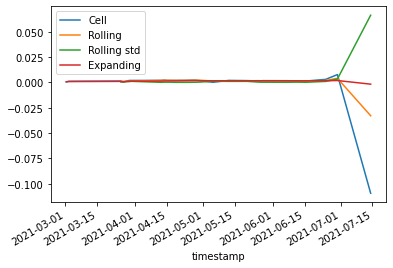

In [156]:
cell = "Fail_cell_8"
df3[cell].plot(label="Cell")
df3.rolling(window=3).mean()[cell].plot(label="Rolling")
df3.rolling(window=3).std()[cell].plot(label="Rolling std")
df3.expanding().mean()[cell].plot(label="Expanding")
plt.legend()

<AxesSubplot:xlabel='timestamp'>

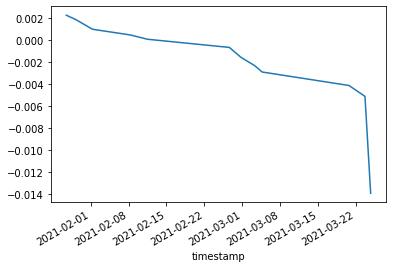

In [110]:
df3.expanding().mean()[cell].plot()

<AxesSubplot:xlabel='timestamp'>

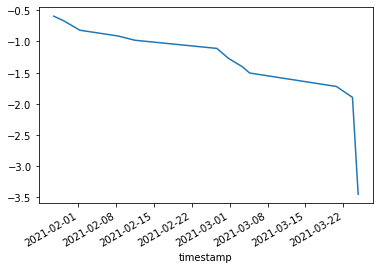

In [111]:
((df3[cell].expanding().mean() -abs(df3[cell].median()))/abs(df3[cell].median())).plot()

In [116]:
df3[cell].expanding().mean()

timestamp
2021-01-27 11:50:57    0.002299
2021-01-29 07:18:31    0.001884
2021-02-01 07:51:17    0.001019
2021-02-08 08:21:08    0.000496
2021-02-11 11:41:04    0.000106
2021-02-26 14:57:40   -0.000638
2021-02-28 18:56:01   -0.001549
2021-03-03 07:48:38   -0.002306
2021-03-04 16:34:52   -0.002882
2021-03-20 17:23:48   -0.004109
2021-03-23 16:35:32   -0.005105
2021-03-24 17:46:51   -0.013939
Name: Fail_cell_10, dtype: float64

In [137]:
df3.var(axis=0).sort_values(ascending=False).iloc[0:2] # Must sort ascending. Since we want largest negative variance

Fail_cell_80    0.024199
Fail_cell_83    0.024109
dtype: float32

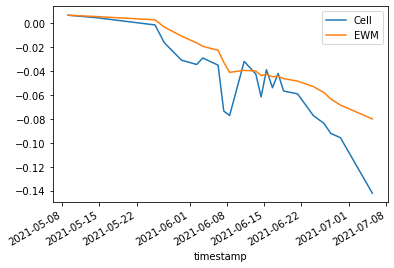

In [76]:
## Exponentially moving average (EWMA)
df3[cell].plot(label="Cell")
df3[cell].ewm(span=12).mean().plot(label="EWM")
plt.legend()

In [118]:
## Decomposa via ETS

In [13]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [38]:
df3[[cell]].sort_index(inplace= True)
df4 = df3[[cell]]+1
df4.index = pd.to_datetime(df4.index, format = '%m/%d/%Y').strftime('%Y-%m-%d')
df4.index

Index(['2020-11-23', '2020-11-24', '2020-11-25', '2020-11-26', '2020-11-27',
       '2020-11-28', '2020-11-30', '2020-12-01', '2020-12-02', '2020-12-03',
       ...
       '2021-12-19', '2021-12-26', '2021-12-29', '2022-01-11', '2022-01-15',
       '2022-01-22', '2022-01-24', '2022-01-26', '2022-01-28', '2022-02-06'],
      dtype='object', name='timestamp', length=216)

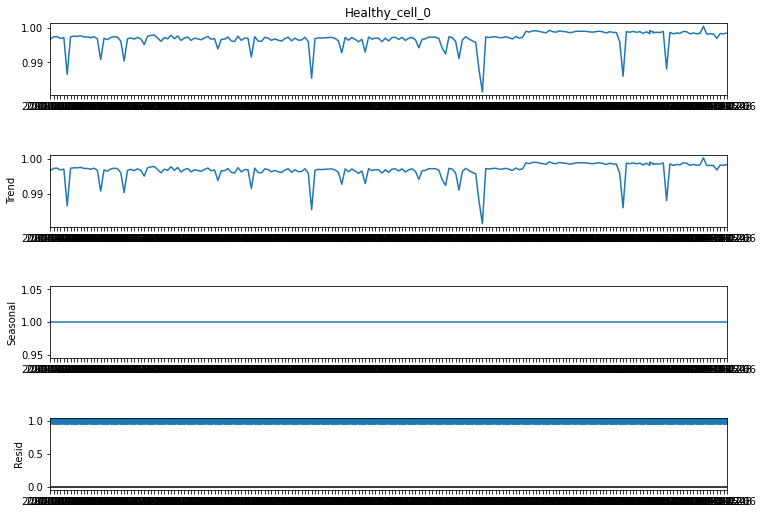

In [57]:
result = seasonal_decompose(x=df4["Healthy_cell_0"],model='multiplicative',period=1) # additive
fig = result.plot()
fig.set_size_inches(12,8)

## ADfuller

In [59]:
from statsmodels.tsa.stattools import adfuller

In [63]:
result = adfuller(df3[cell])

In [64]:
result

(-3.392067192510153,
 0.01123229146463045,
 6,
 209,
 {'1%': -3.4620315036789666,
  '5%': -2.8754705024827127,
  '10%': -2.5741950726860647},
 -1874.6877397394774)

## Check cell variation

In [10]:
df3 = df_clean_last_SOC

In [18]:
df3[df3 < 0].head()

,Healthy_cell_0,Healthy_cell_1,Healthy_cell_2,Healthy_cell_3,Healthy_cell_4,Healthy_cell_5,Healthy_cell_6,Healthy_cell_7,Healthy_cell_8,Healthy_cell_9,...,Healthy_cell_98,Healthy_cell_99,Healthy_cell_100,Healthy_cell_101,Healthy_cell_102,Healthy_cell_103,Healthy_cell_104,Healthy_cell_105,Healthy_cell_106,Healthy_cell_107
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-05-17 06:19:29.269,-0.010692,-0.001527,-0.001527,NaN,-0.003055,NaN,NaN,NaN,-0.004073,NaN,...,-0.004582,-0.000509,-0.011711,-0.003564,NaN,NaN,-0.002546,-0.003564,NaN,NaN
2021-06-02 06:04:13.554,-0.011344,-0.001719,-0.002406,NaN,-0.002406,NaN,NaN,NaN,-0.006531,NaN,...,-0.005156,-0.001719,-0.009282,-0.003781,NaN,NaN,NaN,-0.001031,NaN,NaN
2021-06-03 06:27:50.977,-0.000857,-0.001285,-0.000428,-0.000536,-0.001178,-0.000428,-0.000107,-0.000428,-0.003535,-0.002464,...,-0.001500,-0.001928,-0.000857,-0.000214,NaN,-0.000214,NaN,NaN,NaN,-0.000214
2021-06-07 08:02:36.850,NaN,NaN,NaN,-0.000768,NaN,NaN,-0.000658,-0.000658,-0.000768,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-08 09:40:51.298,NaN,NaN,NaN,-0.000661,NaN,NaN,-0.000441,-0.000330,-0.000551,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
df3[df3 < 0].dropna()

,Healthy_cell_0,Healthy_cell_1,Healthy_cell_2,Healthy_cell_3,Healthy_cell_4,Healthy_cell_5,Healthy_cell_6,Healthy_cell_7,Healthy_cell_8,Healthy_cell_9,...,Healthy_cell_98,Healthy_cell_99,Healthy_cell_100,Healthy_cell_101,Healthy_cell_102,Healthy_cell_103,Healthy_cell_104,Healthy_cell_105,Healthy_cell_106,Healthy_cell_107
timestamp,,,,,,,,,,,,,,,,,,,,,


In [ ]:
df3.drop(df3.var() )

/tmp/ipykernel_2630/379223786.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  ax.bar(df3.columns, df.var())


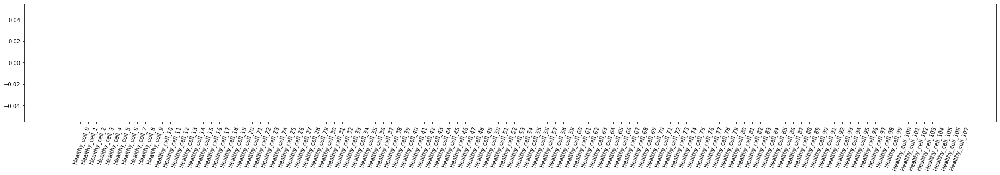

In [9]:
df3 = df_clean_last_SOC
fig, ax = plt.subplots(figsize=(32,4))
ax.bar(df3.columns, df.var())
plt.xticks(rotation=70, ha="left")
plt.show()

<AxesSubplot:>

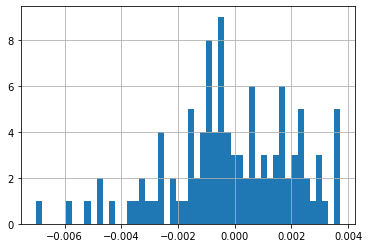

In [66]:
df3.mean().hist(bins=50)

In [13]:
df3[[df3.mean() < 0]]

KeyError: "None of [Index([(True, True, True, True, True, True, True, True, True, True, True, False, False, True, True, False, False, True, True, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, False, False, False, False, False, True, True, True, True, ...)], dtype='object')] are in the [columns]"

In [25]:
df_clean_last_SOC.head(2)

,Healthy_cell_0,Healthy_cell_1,Healthy_cell_2,Healthy_cell_3,Healthy_cell_4,Healthy_cell_5,Healthy_cell_6,Healthy_cell_7,Healthy_cell_8,Healthy_cell_9,...,Healthy_cell_98,Healthy_cell_99,Healthy_cell_100,Healthy_cell_101,Healthy_cell_102,Healthy_cell_103,Fail_cell_104,Healthy_cell_105,Healthy_cell_106,Healthy_cell_107
timestamp,,,,,,,,,,,,,,,,,,,,,
2021-05-10 12:08:01.717,-0.011734,-0.005215,-0.003477,-0.001738,-0.011734,-0.006953,-0.006953,-0.006084,-0.002608,-0.000869,...,0.000869,0.000869,-0.000869,-0.000869,0.002608,0.001738,0.0,0.001738,0.000869,0.005650
2021-05-12 06:48:20.017,-0.000837,-0.001570,-0.001884,-0.000733,-0.002198,-0.000942,-0.002093,-0.000209,0.000209,0.000000,...,-0.000105,0.000419,0.000000,0.000209,-0.000419,-0.000628,0.0,-0.001779,-0.000523,-0.000523


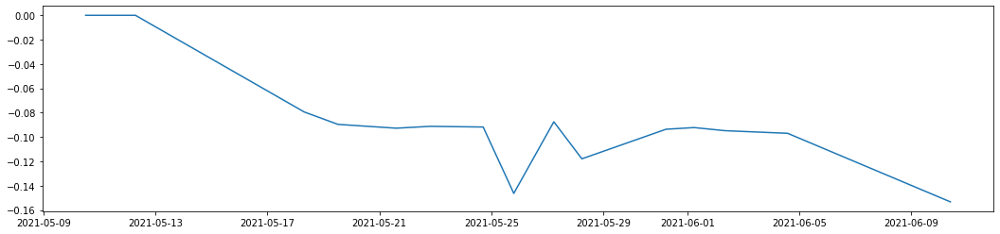

In [27]:
cell = 
fig = plt.figure(figsize=(18, 4))
plt.plot(df_clean_last_SOC["Fail_cell_104"])
plt.show()

In [28]:
df2 =  df_clean_last_SOC[["Fail_cell_104"]]
df2.head()

,Fail_cell_104
timestamp,
2021-05-10 12:08:01.717,0.000000
2021-05-12 06:48:20.017,0.000000
2021-05-18 07:28:48.953,-0.079422
2021-05-19 12:27:49.631,-0.089625
2021-05-21 14:19:46.812,-0.092760


<AxesSubplot:xlabel='timestamp'>

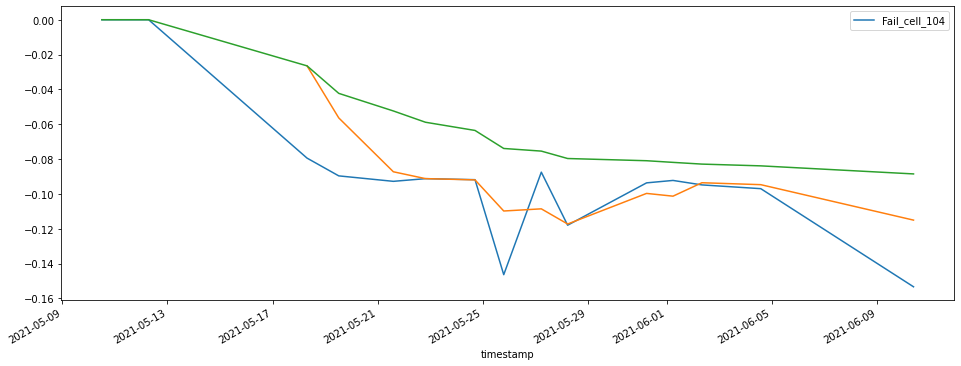

In [30]:
df2.plot(figsize=(16,6))
df2.rolling(window=3).mean()["Fail_cell_104"].plot()
df2.expanding().mean()["Fail_cell_104"].plot()



<AxesSubplot:xlabel='timestamp'>

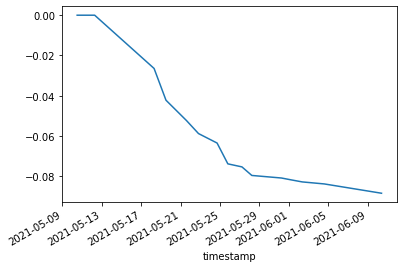

In [32]:
df2.expanding().mean()["Fail_cell_104"].plot()

In [33]:
df2.expanding().mean()["Fail_cell_104"]

timestamp
2021-05-10 12:08:01.717    0.000000
2021-05-12 06:48:20.017    0.000000
2021-05-18 07:28:48.953   -0.026474
2021-05-19 12:27:49.631   -0.042262
2021-05-21 14:19:46.812   -0.052361
2021-05-22 19:38:29.219   -0.058838
2021-05-24 16:54:41.758   -0.063547
2021-05-25 19:08:08.528   -0.073896
2021-05-27 05:27:17.370   -0.075407
2021-05-28 05:30:20.920   -0.079660
2021-05-31 05:35:07.936   -0.080931
2021-06-01 05:42:52.270   -0.081873
2021-06-02 08:10:10.385   -0.082869
2021-06-04 13:52:49.562   -0.083875
2021-06-10 09:23:15.848   -0.088503
Name: Fail_cell_104, dtype: float64

## Undersök variance och variance threshold

## Undersök vilka plottar som kan vara intressanta i funk ovan

<AxesSubplot:ylabel='Frequency'>

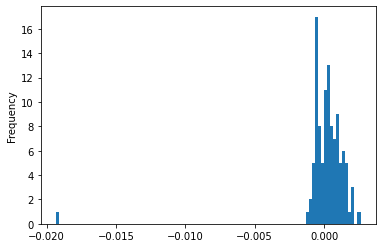

In [342]:

df_clean_last.mean().plot(kind="hist",bins=100)


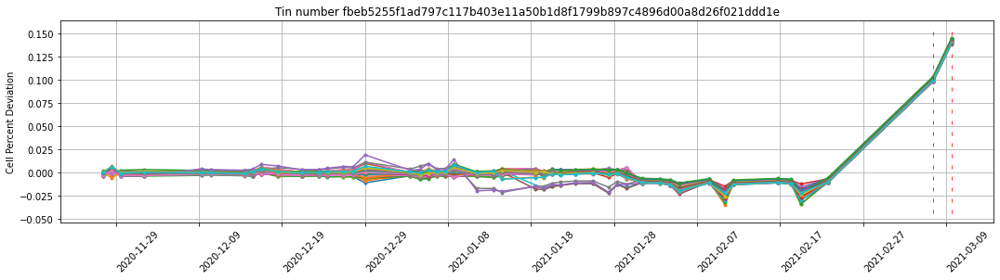

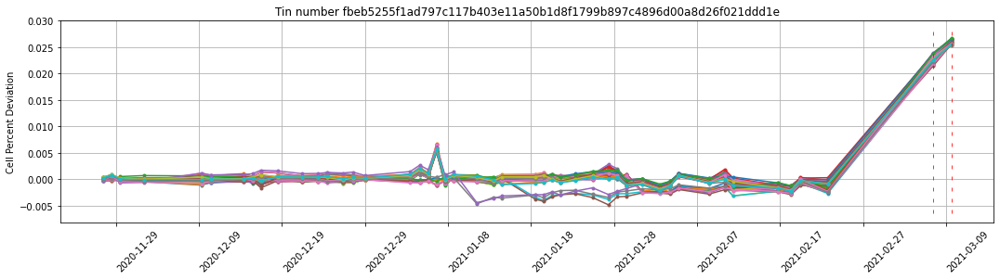

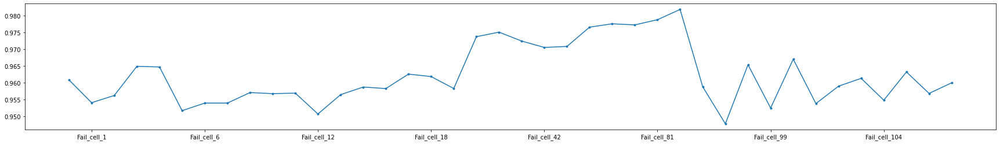

In [341]:
df_clean_last_SOC, df_tin_last_SOC = plot_cells(df, show_legend=False, show_cells=1, method="Sorted_SOC_deviation")
df_clean_last_Voltage, df_tin_last_Voltage = plot_cells(df, show_legend=False, show_cells=1, method="Sorted_Voltage_deviation")

df_clean_last_SOC.drop(healty_column_names(df_clean_last_SOC), axis=1,inplace=True)
df_clean_last_Voltage.drop(healty_column_names(df_clean_last_Voltage), axis=1,inplace=True)

fig, ax = plt.subplots(figsize=(30,4))
ax.plot(df_clean_last_SOC.corrwith(df_clean_last_Voltage,axis=0),marker='.')
ax.xaxis.set_major_locator(mdates.DayLocator(interval=5))

/home/jovyan/.envs/lib/python3.9/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



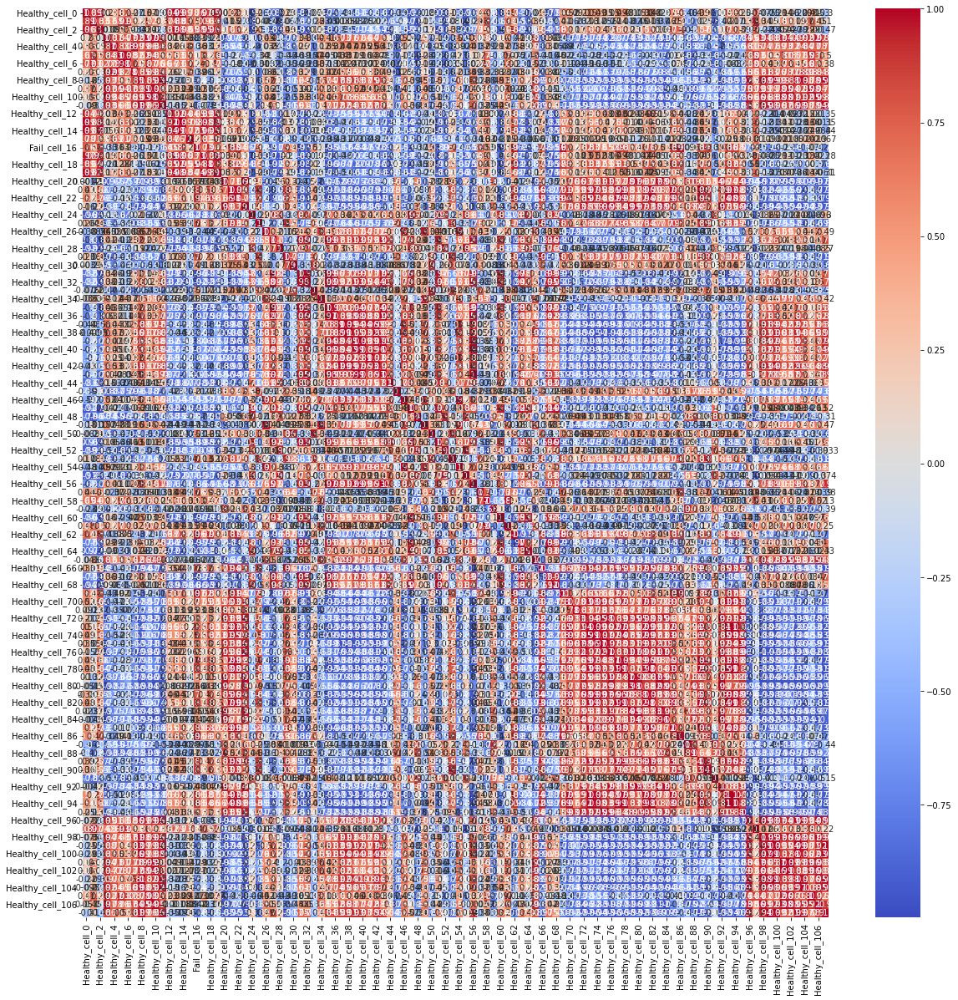

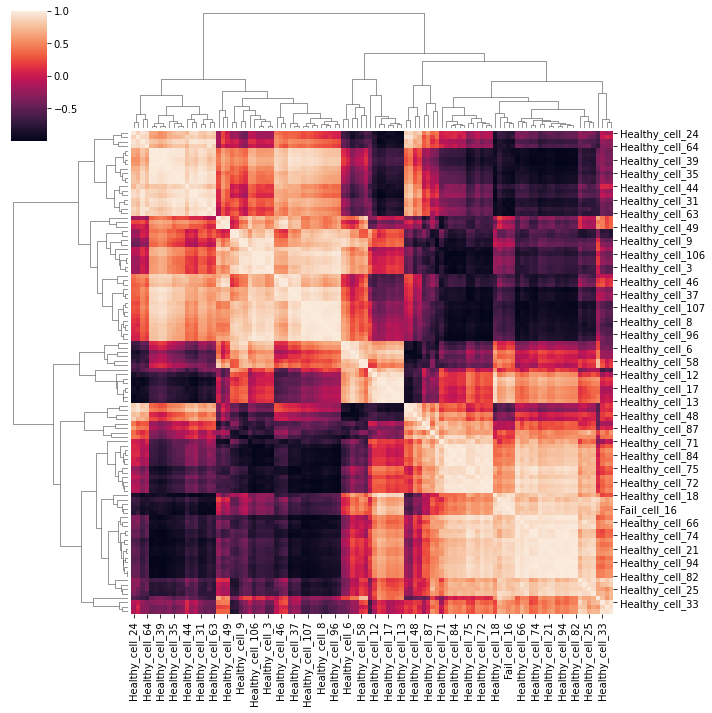

In [83]:
import seaborn as sns
fig,ax = plt.subplots(1,1,figsize=(20,20))
ax = sns.heatmap(df_clean_last_SOC.corr(),annot=True,cmap="coolwarm")
sns.clustermap(df_clean_last_SOC.corr())

In [ ]:
### Denna kan användas för att plogga linestyles
from matplotlib import cm
viridis = cm.get_cmap('Reds', 2)
viridis(range(8))

## Orginalkod

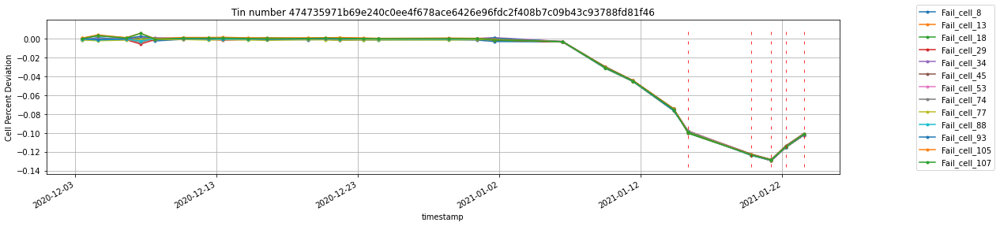

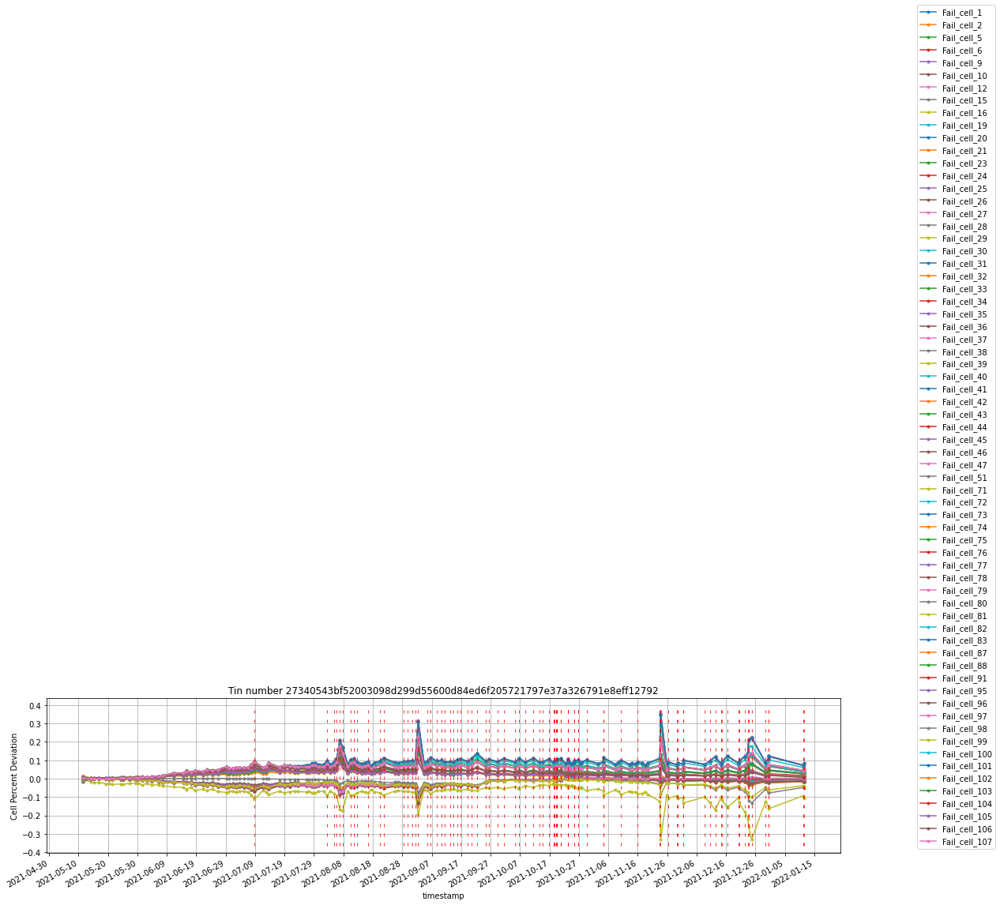

[]


In [22]:
############################################################################
############################# ORGINAL KOD ##################################
############################################################################

failed_tinnumbers = []
# Parameters


# Add column with failed cell
df["Failed cell SOC"] = df["Sorted_SOC"].apply(get_SOC_failed_cells)
df["Failed cell Voltage"] = df["Sorted_Voltage"].apply(get_SOC_failed_cells)

cars = df["tin_an"].unique()

for car in range(len(cars)):
    # Get List of individual Tins
    df_tin = df[df["tin_an"] == cars[car]]
    df_tin = df_tin.reset_index()

    max_index = df_tin[df_tin["Fail"] == 1].index.values
    last_idx = max_index[-1]
    df_tin = df_tin[:last_idx + 1]

    #df_tin = df_tin[df_tin["Fail"] ==1]
    #df = df_tin.head(3)

    # Apply normalization (deviation)
    df_tin["Sorted_SOC_deviation"] = df_tin["Sorted_SOC"].apply(normalize)
    df_failed_cells = df_tin[df_tin["Failed cell SOC"].str.len() != 0]

    Un = np.array(df_failed_cells["Failed cell SOC"]) # Array with all arrays of failed cells (array[array[1,2], array[1,2])
    failed_cells = []
    for i in Un:
        failed_cells.extend(list(i))
    failed_cells = list(set(failed_cells))
    failed_cells.sort()

    cell_fails = df_tin["Sorted_SOC_deviation"].apply(lambda i:filter_failed_cells(i,failed_cells))

    df_clean = pd.DataFrame([x for x in cell_fails])
    df_clean.columns = ['Fail_cell_{}'.format(x) for x in failed_cells]
    df_clean.insert(0, "timestamp",df_tin["timestamp"])

    #df_clean.insert(0, "tin_an",df_tin["tin_an"])
    df_clean.set_index('timestamp',inplace=True)

    dates = df_failed_cells["timestamp"].to_list()
    try:
        ax =df_clean.plot.line(figsize=(18,4),marker='.')
        ymin, ymax = ax.get_ylim()
        ax.vlines(x=dates, ymin=ymin, ymax=ymax, color='r',linewidth=0.8, linestyle=(0,(5,10))) # https://matplotlib.org/3.5.0/gallery/lines_bars_and_markers/linestyles.html
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10)) 
        plt.legend(bbox_to_anchor=(1.2, 0.0), loc='lower right')
        ax.set_title(f'Tin number {cars[car]}')
        ax.set_ylabel("Cell Percent Deviation")

        plt.grid()
        plt.show()
    except: 
        TypeError 
        failed_tinnumbers.append(cars[car])

print(failed_tinnumbers)
############################################################################
############################# ORGINAL KOD ##################################
############################################################################

## Test av list med Tin

In [7]:
tinlist = ('a82ab98a64dab23bf4aa1bbee6bcf2f8b4f23a5de74edfe79a7ceff3e2dd850c',
       '046994de6e1e013c2d4162502e19eb7b42a764c83d6d1213bf6d6bcd44b7ed49',
       '74f89d7e6a68aa5de245f7ea839d0db10815d44502a2112e192010ee2d60c629',
       '277f8f8aec3534be8448220ea3b99127dd8fc2bddb9140c25e97d8bf46dd1d1e',
       '0144e57f668058ebb3703b1fcdadd896fdb038f2449b729e5886ae7d51fe0725',
       'eb830e4babf5934638657124ac896b2b3ecb681011260e66ad48f746dd03a901',
       'd095e3278854e2999cd6aa3cf423457179d50c47de33ff07e0fed6aaa81099e3',
       '77cb437f82a3b29b021b16e028614ee48068d84a9dfa8e71762ff8ac1f92bf14',
       '265873d8277b1ff05fdce33bab3a292fcdf4be4df0103d388a82cb0ba5700108',
       '9728f656bdcff7aef9888478ebc2e7835936c52ba3b5e7bb6f69a554cb88af09',
       'aa595bd086d8454d1b8c50d8ca48b004773acf5199f7a12d53a1e3c3587c1096',
       '16b533e2d5cbfb3fa66357503bd773ebdfea557537f02bf088c067210798bbc1',
       '102ee98b695abed670870d66ed9d8e9a78c7a4343f480a0e5bffc51af03076d7',
       '460ed755a597b2b685a7ab5e02ecd5c073aff7735a18f82633ba8006da2d7f5c',
       '36ea9106b280d52434942ab822e91e1a602bd8517b1499ab32c0e48d368f046e')

tinlist2= ('d095e3278854e2999cd6aa3cf423457179d50c47de33ff07e0fed6aaa81099e3',
'd095e3278854e2999cd6aa3cf423457179d50c47de33ff07e0fed6aaa81099e3')

query = f"SELECT main_table.tin_an, [timestamp], [Sorted_SOC],[Sorted_Voltage],\
            cell_fail.Fail FROM main_table \
            INNER JOIN cell_fail \
            ON main_table.rid = cell_fail.rid \
            WHERE [tin_an] in {tinlist}"

df = ap.load_sql(query, db="df.db")
df.head()

,tin_an,timestamp,Sorted_SOC,Sorted_Voltage,Fail
0,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2021-08-30 14:59:38.728,"[36.27, 36.49, 36.41, 36.07, 35.88, 36.32, 36....","[3.6228, 3.6238, 3.6234, 3.6222, 3.6213, 3.623...",0
1,0144e57f668058ebb3703b1fcdadd896fdb038f2449b72...,2021-03-09 12:13:41.000,"[66.63, 66.74, 66.71, 66.68, 66.46, 66.54, 66....","[3.8626, 3.8639, 3.8636, 3.863, 3.8606, 3.8619...",0
2,046994de6e1e013c2d4162502e19eb7b42a764c83d6d12...,2021-05-19 11:35:33.000,"[67.89, 67.64, 67.68, 67.65, 67.77, 67.77, 67....","[3.8753, 3.8731, 3.8735, 3.873, 3.874, 3.8743,...",0
3,046994de6e1e013c2d4162502e19eb7b42a764c83d6d12...,2021-10-22 09:10:08.471,"[56.57, 56.29, 56.31, 56.29, 56.41, 56.43, 56....","[3.7495, 3.7478, 3.7486, 3.7474, 3.7489, 3.749...",0
4,046994de6e1e013c2d4162502e19eb7b42a764c83d6d12...,2021-06-08 08:37:40.000,"[77.08, 76.82, 76.87, 76.83, 76.94, 76.95, 76....","[3.9712, 3.9688, 3.9695, 3.9689, 3.9698, 3.970...",0


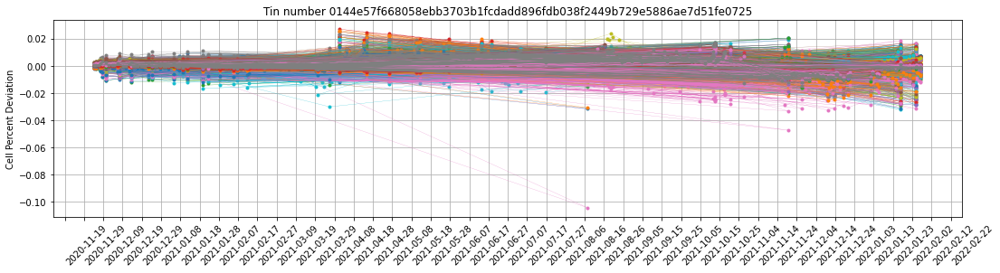

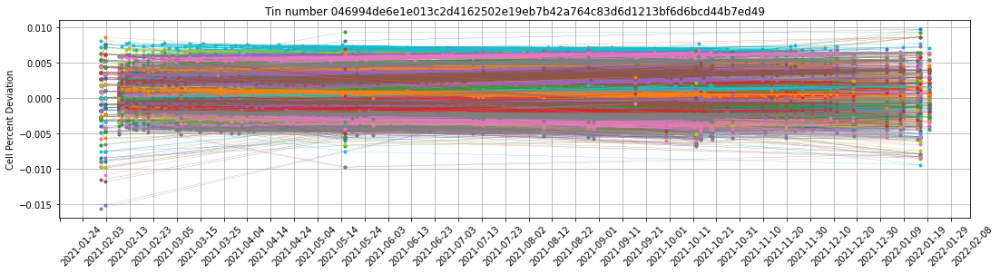

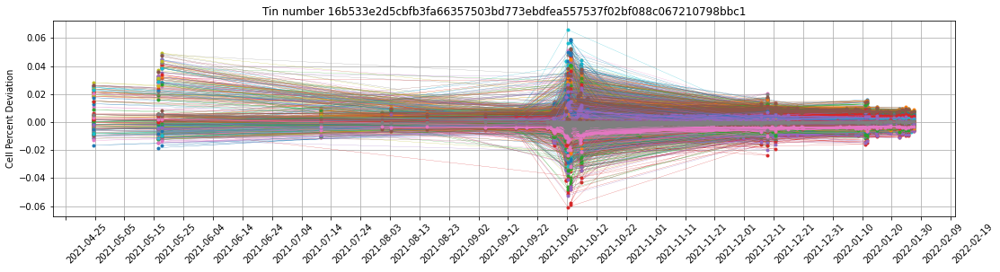

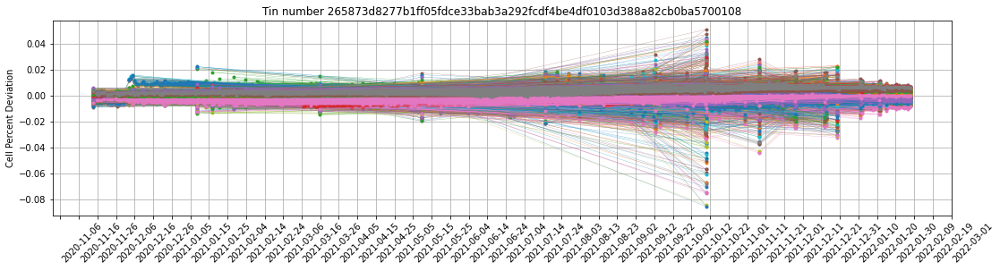

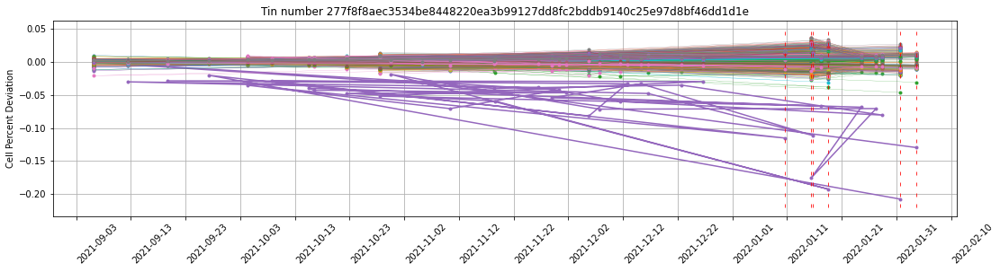

...

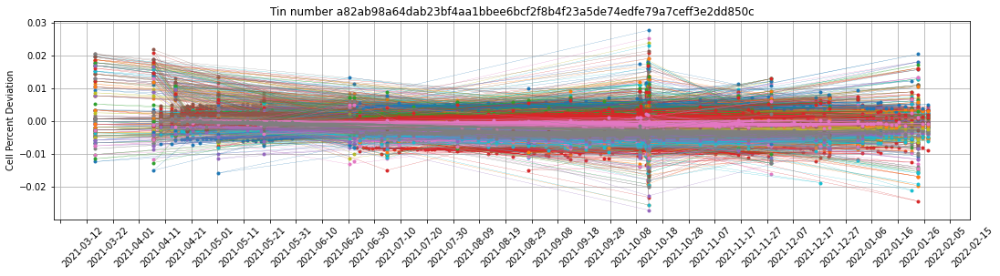

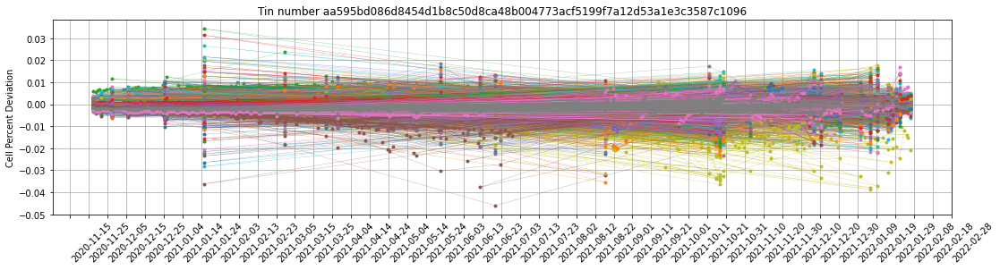

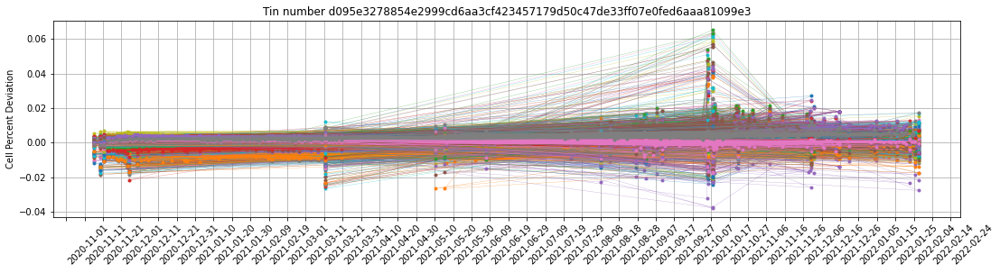

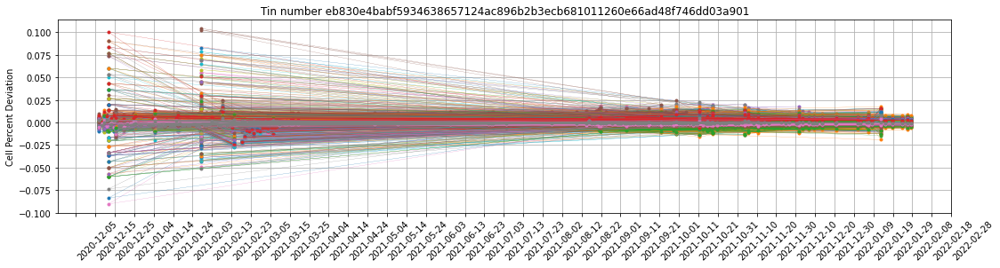

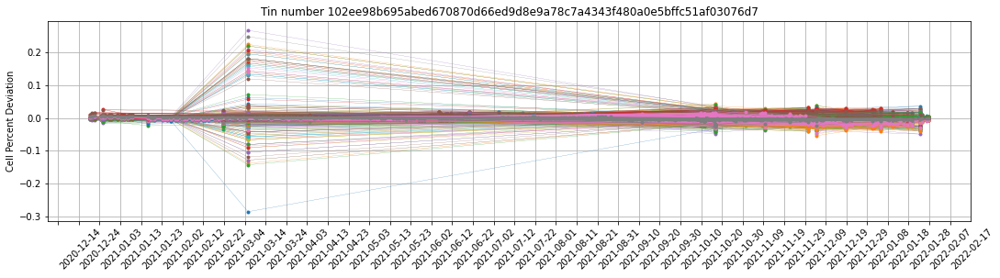

In [8]:
df_clean_last, df_tin = plot_cells(df, show_legend=False, show_cells="all")

In [99]:
df_tin.head()

,index,tin_an,timestamp,Sorted_SOC,Sorted_Voltage,Fail,Failed cell SOC,Failed cell Voltage,Sorted_SOC_deviation
0,0,d095e3278854e2999cd6aa3cf423457179d50c47de33ff...,2020-11-28 07:52:30.000,"[80.51, 80.4, 80.41, 80.29, 80.57, 80.43, 80.3...","[4.0193, 4.019, 4.0188, 4.0167, 4.0198, 4.019,...",0,[],[],"[0.0025527903, 0.001183005, 0.0013075569, -0.0..."
1,1,d095e3278854e2999cd6aa3cf423457179d50c47de33ff...,2021-12-02 08:02:10.009,"[84.62, 84.54, 84.59, 84.72, 84.6, 84.57, 84.6...","[4.0401, 4.04, 4.0402, 4.0412, 4.0399, 4.04, 4...",0,[],[],"[-0.0021814464, -0.0031248087, -0.0025352747, ..."
2,2,d095e3278854e2999cd6aa3cf423457179d50c47de33ff...,2021-05-20 10:18:18.000,"[25.97, 26.25, 26.16, 26.3, 26.16, 26.19, 26.2...","[3.5763, 3.578, 3.5774, 3.5775, 3.5768, 3.5774...",0,[],[],"[-0.008400199, 0.0022909304, -0.0011455016, 0...."
3,3,d095e3278854e2999cd6aa3cf423457179d50c47de33ff...,2021-10-17 09:25:50.352,"[88.42, 88.35, 88.38, 88.52, 88.42, 88.37, 88....","[4.078, 4.0778, 4.078, 4.079, 4.0779, 4.0778, ...",0,[],[],"[-0.0020878909, -0.0028779106, -0.002539343, -..."
4,4,d095e3278854e2999cd6aa3cf423457179d50c47de33ff...,2021-10-22 14:05:02.557,"[62.33, 62.26, 62.31, 62.43, 62.32, 62.28, 62....","[3.8299, 3.8292, 3.8297, 3.8308, 3.8299, 3.829...",0,[],[],"[-0.0025604072, -0.0036806425, -0.0028804657, ..."


In [100]:
df_clean_last.head()

,Healthy_cell_0,Healthy_cell_1,Healthy_cell_2,Healthy_cell_3,Healthy_cell_4,Healthy_cell_5,Healthy_cell_6,Healthy_cell_7,Healthy_cell_8,Healthy_cell_9,...,Healthy_cell_98,Healthy_cell_99,Healthy_cell_100,Healthy_cell_101,Healthy_cell_102,Healthy_cell_103,Healthy_cell_104,Healthy_cell_105,Healthy_cell_106,Healthy_cell_107
timestamp,,,,,,,,,,,,,,,,,,,,,
2020-11-28 07:52:30.000,0.002553,0.001183,0.001308,-0.000187,0.003300,0.001557,-0.000062,0.001806,0.002553,0.002428,...,0.000685,0.000436,0.003300,0.000809,0.001183,0.001930,0.003923,0.001058,0.001432,0.001806
2021-12-02 08:02:10.009,-0.002181,-0.003125,-0.002535,-0.001002,-0.002417,-0.002771,-0.002299,-0.001238,-0.001474,-0.002889,...,-0.001828,0.000295,0.000295,-0.002064,-0.001238,-0.000884,-0.000177,-0.000413,-0.000059,0.003596
2021-05-20 10:18:18.000,-0.008400,0.002291,-0.001146,0.004200,-0.001146,0.000000,0.003055,0.003055,0.000000,0.002291,...,0.003055,0.008400,0.007255,0.003055,0.004200,0.005346,0.002291,0.006491,0.006491,0.009546
2021-10-17 09:25:50.352,-0.002088,-0.002878,-0.002539,-0.000959,-0.002088,-0.002652,-0.002314,-0.001298,-0.001524,-0.002878,...,-0.001862,0.000282,0.000169,-0.002088,-0.001411,-0.000959,0.000056,-0.000282,0.000056,0.003442
2021-10-22 14:05:02.557,-0.002560,-0.003681,-0.002880,-0.000960,-0.002720,-0.003361,-0.002400,-0.001280,-0.001600,-0.003361,...,-0.001600,0.001440,0.000960,-0.001920,-0.000960,-0.000480,-0.000800,-0.001440,-0.000800,0.005281


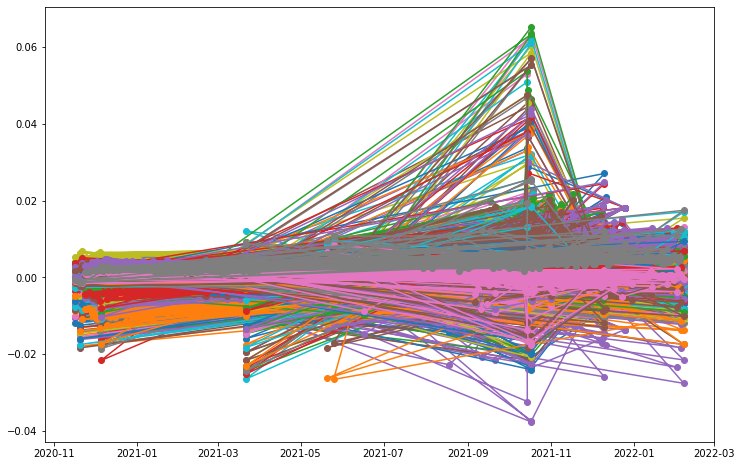

In [109]:
fig, ax = plt.subplots(figsize=(12,8))
for col in df_clean_last.columns:
    ax.plot(df_clean_last[col],"-o")

In [112]:
df_clean_last = df_clean_last.abs()
a = df_clean_last.max(axis=1)

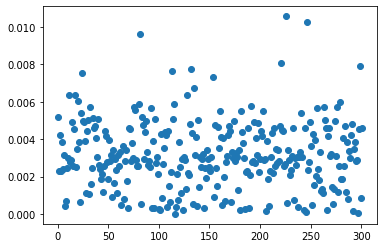

In [138]:
leng = len(df_clean_last["Healthy_cell_12"])
plt.scatter(range(leng), df_clean_last["Healthy_cell_12"])

In [118]:
for i in range(30):
    print(a[i])

0.009650726
0.009256483
0.026345953
0.0085210195
0.013282093
0.009079078
0.010923203
0.006550827
0.005976821
0.006662842
0.013181156
0.0181695
0.048888844
0.009170924
0.00974117
0.0088944975
0.008027718
0.01815704
0.0082582
0.011502729
0.012104637
0.014714538
0.0060438905
0.010453969
0.018593008
0.009642444
0.009438787
0.00743844
0.021585409
0.012302644


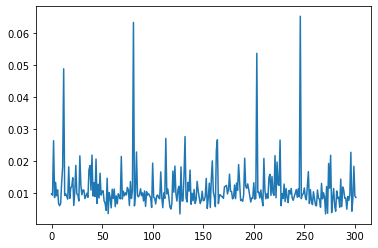

In [119]:
plt.plot(a)

In [17]:
import psutil
f"{psutil.virtual_memory()[2] :>{2}} % RAM used"


'12.0 % RAM used'

In [ ]:
import random
fig,ax = plt.subplots(1,2,figsize=(6, 6))
ax[1] = fig.add_subplot(projection='3d')

x = np.linspace(0,107,108)
y =  df_clean_last_SOC.mean()
z = df_clean_last_SOC.index
sequence_containing_z_vals = list(range(0, 108))


#

plt.show()

/tmp/ipykernel_1360/3741242667.py:75: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.xaxis.set_ticklabels(x)
/tmp/ipykernel_1360/3741242667.py:76: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.yaxis.set_ticklabels(y)
/tmp/ipykernel_1360/3741242667.py:77: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.zaxis.set_ticklabels(dates_formatted)


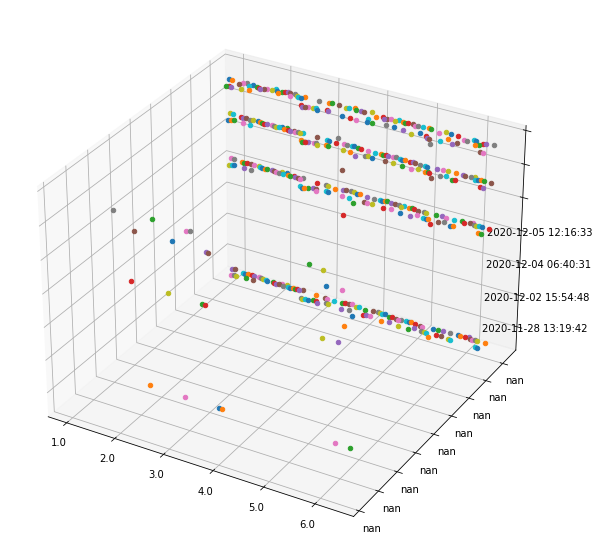

In [90]:
show_legend=False 
show_cells="all",
method="Sorted_SOC_deviation"

"""
Function takes in df
show_legend: True / False
show_cells: [1: only fail] [0: Only Healthy] ["all": Both healthy and fail]
Method: ["Sorted_SOC_deviation"] ["Sorted_Voltage_deviation"]
"""

plot_params ={"linewidth":{
                            0: 0.2,
                            1: 1.5,
                            },
                "linestyle":{0: "solid", #(0,(3,5,1,5)), # dashdotted
                            1: "solid",
                            }
            }


# Annotate with Failed cell SOC and Voltage
df["Failed cell SOC"] = df["Sorted_SOC"].apply(get_SOC_failed_cells)
df["Failed cell Voltage"] = df["Sorted_Voltage"].apply(get_SOC_failed_cells)

#global cars
cars = df["tin_an"].unique()


#for car in range(len(cars)):
for car in range(1):
    
    # Get List of individual Tins
    df_tin = df[df["tin_an"] == cars[car]]
    df_tin = df_tin.reset_index()

    # Get type of fail (0 or 1)
    fail_type = df_tin["Fail"].unique().max()

    # Apply normalization (deviation)
    df_tin["Sorted_SOC_deviation"] = df_tin["Sorted_SOC"].apply(normalize)
    df_tin["Sorted_Voltage_deviation"] = df_tin["Sorted_Voltage"].apply(normalize)

    fail_dates = []
    failed_cells = []
    if fail_type == 1:
        df_tin = delete_rows_after_lastfail(df_tin)

        cell_fails, failed_cells, fail_dates = get_cell_fails_array(df_tin)
    
    # Generate dataframe with cells as columns
    df_clean = generate_cell_df(df_tin, failed_cells, method)

    # Plot cells
    fig = plt.figure(figsize = (14, 10))
    ax = fig.add_subplot(111, projection = '3d')
    #fig = plt.figure(figsize=(12, 12))
    #ax = fig.add_subplot(projection='3d')


        

    # Plot scatterplot of cell mean
    color = [get_cell_status(i) for i in df_clean.columns.tolist()]
    #color = ax[0].get_color()
    z = df_clean.index.values.astype(float)
    dates_formatted = [pd.to_datetime(d) for d in z]
    for j in reversed(range(len(df_clean))):
        x = np.linspace(0,107,108)
        y =  df_clean.iloc[0:j].mean()
        

        for i in range(len(x)):
            ax.scatter(x[i], y[i], z[j])
    ax.xaxis.set_ticklabels(x)
    ax.yaxis.set_ticklabels(y)
    ax.zaxis.set_ticklabels(dates_formatted)
    

In [12]:
from plotly import __version__
import cufflinks as cf
from plotly.offline import init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
layout1 = cf.Layout(
    height=600,
    width=1000
)

cf.go_offline()
df3.iplot(layout=layout1.to_plotly_json())